# Kernel Density Estimation and Regression Analysis of Marathon Results



# 1 Introduction  
Kernel density estimation (KDE) is an unsupervised learning and in statistics it is a nonparametric method for estimating density function. This is a smoother version of histogram of the dataset. In KDE each data point is replaced by a kernel to estimate the probability density function. The linear regression is a supervised machine learning algorithm that tries to find a best fit linear relation between two variables one is dependent and another one is independent. Generally there two kind of linear regression model one is simple and another one is multiple. In simple linear regression model there is only one independent variable and in multiple linear regression model there are more than one independent variables which are used to predict the value of the target variable. In this project, we compute 1-dimensional and 2-dimensional KDE and also using the Bayes' theorem we predict that a runner is either male or female given their finish time in the case of 1-dimensional KDE and finish time and age for the case of 2-dimensional KDE. Later, we compare the prediction accuracy with the prediction by k-NN method. Finally,we build linear regression model: simple as well as multiple by using the time for completing the 5K and also the age, gender to predict the finish time. In all cases, we use the Marathon results data. 

# 2 Importing Data

In [115]:
# Importing the basic libraries 
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

First of all, we keep the data file in the same directory and then read the file. Let's check the files in the directory.

In [3]:
ls

Project 6.ipynb       marathon_results.csv


In [116]:
# Read the data file
df = pd.read_csv('marathon_results.csv')
df.head(5)

,Age,M/F,Country,5K,10K,15K,20K,Half,25K,30K,35K,40K,Finish,Pace,Overall,Gender,Division
0,25,M,ETH,00:14:43,00:29:43,00:44:57,01:00:29,01:04:02,01:16:07,01:32:00,01:47:59,02:02:39,02:09:17,00:04:56,1,1,1
1,30,M,ETH,00:14:43,00:29:43,00:44:58,01:00:28,01:04:01,01:16:07,01:31:59,01:47:59,02:02:42,02:09:48,00:04:58,2,2,2
2,29,M,KEN,00:14:43,00:29:43,00:44:57,01:00:29,01:04:02,01:16:07,01:32:00,01:47:59,02:03:01,02:10:22,00:04:59,3,3,3
3,28,M,KEN,00:14:43,00:29:44,00:45:01,01:00:29,01:04:02,01:16:07,01:32:00,01:48:03,02:03:47,02:10:47,00:05:00,4,4,4
4,32,M,KEN,00:14:43,00:29:44,00:44:58,01:00:28,01:04:01,01:16:07,01:32:00,01:47:59,02:03:27,02:10:49,00:05:00,5,5,5


The the column in the dataframe is object, so we need to convert it into numerical value. We convert the time into minutes unit.

In [117]:
df["Finish_time(m)"] = pd.to_timedelta(df["Finish"]).dt.total_seconds()/60
df.head(5)

,Age,M/F,Country,5K,10K,15K,20K,Half,25K,30K,35K,40K,Finish,Pace,Overall,Gender,Division,Finish_time(m)
0,25,M,ETH,00:14:43,00:29:43,00:44:57,01:00:29,01:04:02,01:16:07,01:32:00,01:47:59,02:02:39,02:09:17,00:04:56,1,1,1,129.283333
1,30,M,ETH,00:14:43,00:29:43,00:44:58,01:00:28,01:04:01,01:16:07,01:31:59,01:47:59,02:02:42,02:09:48,00:04:58,2,2,2,129.800000
2,29,M,KEN,00:14:43,00:29:43,00:44:57,01:00:29,01:04:02,01:16:07,01:32:00,01:47:59,02:03:01,02:10:22,00:04:59,3,3,3,130.366667
3,28,M,KEN,00:14:43,00:29:44,00:45:01,01:00:29,01:04:02,01:16:07,01:32:00,01:48:03,02:03:47,02:10:47,00:05:00,4,4,4,130.783333
4,32,M,KEN,00:14:43,00:29:44,00:44:58,01:00:28,01:04:01,01:16:07,01:32:00,01:47:59,02:03:27,02:10:49,00:05:00,5,5,5,130.816667


# 3 Kernel Density Estimation (KDE) 
Kernel density estimation(KDE) is method to estimate the density function of a random variable. In this section, we compute 1-dimensional and 2-dimensional KDE of male and female runners using their finish times. Also use the Bayes' theorem to compute the probability that a runner is female with the given finished time. 

First of all, we split out the data into train, test and validation by using sklearn then we separate the data of male and female runners. The validation data will be used for selecting the best estimator bandwidth and test data set will be used for measuring the accuracy. We take 50% data as train and then 25% as test and 25% as validation set.


In [118]:
# Spliting the train and test 
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(df, test_size = 0.5, random_state=123)
valid_df, test_df = train_test_split(test_df, test_size = 0.5, random_state=123)

In [119]:
# Separating the nmale and female runners' train and test data and validation 
dfm_train = train_df[train_df['M/F']=='M']
dff_train = train_df[train_df['M/F']=='F']

dfm_test = test_df[test_df['M/F']=='M']
dff_test = test_df[test_df['M/F']=='F']

dfm_valid = valid_df[valid_df['M/F']=='M']
dff_valid = valid_df[valid_df['M/F']=='F']

## 3.1 Computing 1-Dimensional Kernel Density Estimation

Now, we compute 1-dimensional KDE for male and female runners and then use the Bayes theorem for predicting that a runner is female given the finish time. We use the scipy.stats.gaussian_kde from scipy library for kernel density estimation. At first we use finish time to compute 1-dimensional KDE. 

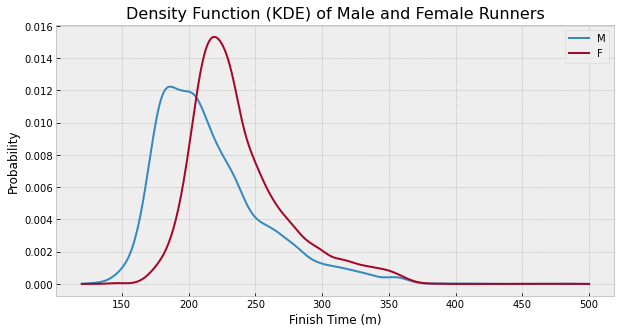

In [46]:
# Importing gaussian_kde
from scipy.stats import gaussian_kde
# KDE for male and female runners with finish time
kdem = gaussian_kde(dfm_train['Finish_time(m)'])
kdef = gaussian_kde(dff_train['Finish_time(m)'])

#Plotting the density function
plt.style.use('bmh')
plt.figure(figsize=(10,5))
x = np.linspace(120, 500, 400)
plt.plot(x, kdem(x), label = 'M');
plt.plot(x, kdef(x), label = 'F');
plt.xlabel('Finish Time (m)')
plt.ylabel('Probability')
plt.title('Density Function (KDE) of Male and Female Runners', fontsize = 16)
plt.legend()
plt.show()


**Calculating the best estimator bandwidth**

We would like to add estimator bandwidth in the KDE. So we calculate the best value of bandwidth by using the log likelihood.

In [53]:
#List of bandwidth values
bw_choices_m = []
bw_choices_f = []
for bw in np.linspace(0.05, 0.4, 20):
    # Estimating Gaussian KDE in train set for different bandwidth
    kde_m = gaussian_kde(dfm_train['Finish_time(m)'], bw_method = bw)
    kde_f = gaussian_kde(dff_train['Finish_time(m)'], bw_method = bw)
    # Calculating loglikelihood in validation data
    log_likelihood_m = np.log(kde_m(dfm_valid['Finish_time(m)'])).sum()
    log_likelihood_f = np.log(kde_f(dff_valid['Finish_time(m)'])).sum()
    # Storing in the lis
    bw_choices_m.append((bw, log_likelihood_m))
    bw_choices_f.append((bw, log_likelihood_f))
    
# Calculating the best value 
bw_male = np.array(bw_choices_m)
bw_female = np.array(bw_choices_f)
best_bw_m = bw_male[:, 0][bw_male[:, 1]==bw_male[:, 1].max()].item()
best_bw_f = bw_female[:, 0][bw_female[:, 1]==bw_female[:, 1].max()].item()

print(f"The best estimator bandwidth for female runners: \n {best_bw_f}\n")
print(f"The best estimator bandwidth for male runners: \n {best_bw_m}")

The best estimator bandwidth for female runners: 
 0.1236842105263158

The best estimator bandwidth for male runners: 
 0.1236842105263158


Now, we calculate the KDE for both male and female runners with best estimator bandwidth value.

In [57]:
# The Best KDE for male and female runners with finish time
kdem = gaussian_kde(dfm_train['Finish_time(m)'], bw_method = best_bw_m)
kdef = gaussian_kde(dff_train['Finish_time(m)'], bw_method = best_bw_f)

**Bayes' Theorem**

Now we use the Bayes' theorem for calculating the probabiloity. If $A$ and $B$ are two events with probability $P(A)$ and $P(B)$ respectively then Bayes' theorem states that 
$$P(A|B) = \frac{P(B|A)P(A)}{P(B)}$$
where $P(A|B)$ is the posterior probability of event $A$. In our case, we can find the probability of a runner to be either male or female. Also the probability of finish time that a male/female runner. 

In [58]:
# Probability calculation 
def prob_female(time):
    """
    This funcition will calculate the probility that a runner is female given the finish time.
    
    Args:
        time :
            A float, the time needed to finish the run for a runner
        
    Returns:
        prob : 
        The probability that the runner is female who complete the run in the given time.
    """
    
    # The probability of male runner
    probM= dfm_train['M/F'].count()/train_df['M/F'].count()
    # The probability of male runner
    probF= dff_train['M/F'].count()/train_df['M/F'].count()
    # Total probability
    total_P = kdem(time)*probM+ kdef(time)* probF
#     if gender=='M':
#         prob = kdem(time)*probM/total_P
#     elif gender == 'F':
    # Bayes rule
    prob = kdef(time)* probF/total_P 
    return prob

Let's see the probability that a runner is female given the finish time.

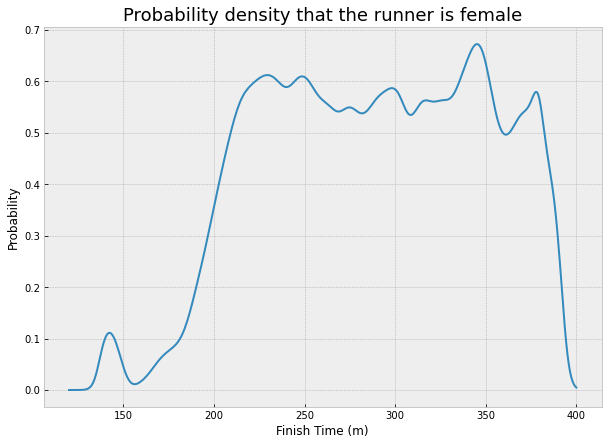

In [59]:
# Finish time 
x = np.linspace(120, 400, 400)
# Calculating probability
pdf=prob_female(time=x)
#Plotting the density function
plt.style.use('bmh')
plt.figure(figsize=(10,7))
plt.plot(x, pdf);
plt.xlabel('Finish Time (m)')
plt.ylabel('Probability')
plt.title('Probability density that the runner is female', fontsize=18)
plt.show()

The figure shows that the runner who can finish the run approximately in between 210m to 380m is highly likely female. 


**Prediction Accuracy**

Now we calculate the prediction accuracy on test data set by considering the if the probability is greater than or equal to 0.5 in a given time then the runner is female.

In [60]:
# Finding probability on test set
pdf_f = prob_female(test_df['Finish_time(m)'])

In [61]:
accuracy_kde1 = round((sum((test_df['M/F']=='F')==(pdf_f>=0.5))/ test_df['M/F'].count())*100,2)

# Priniting the accuracy
print(f" The prediction accuracy on predicting that a runner is female finished her run in a given time: \n \
{accuracy_kde1}%")


 The prediction accuracy on predicting that a runner is female finished her run in a given time: 
 65.79%


## 3.2 Computing 2-Dimensional Kernel Density Estimation
So far the only one variable (finish time) has been used to estimate the kernel density. Now we use one more variable, age of the runners to estimate a 2-dimensional KDE. The procedure is similar as before and we follow the same sequence of works. But in this case when the data will be inserted into gaussian_kde, we need to care of them and need to take transpose so that finish time will be one row and age will be another row. Firstly calculate the best estimator bandwidth value.

In [120]:
#List of bandwidth values
bw_choices_m2 = []
bw_choices_f2 = []
for bw in np.linspace(0.05, 0.4, 20):
    # Estimating Gaussian KDE in train set for different bandwidth
    kde_m2 = gaussian_kde(dfm_train[['Finish_time(m)', 'Age']].T, bw_method = bw)
    kde_f2 = gaussian_kde(dff_train[['Finish_time(m)', 'Age']].T, bw_method = bw)
    # Calculating loglikelihood in validation data
    log_likelihood_m2 = np.log(kde_m2(dfm_valid[['Finish_time(m)', 'Age']].T)).sum()
    log_likelihood_f2 = np.log(kde_f2(dff_valid[['Finish_time(m)', 'Age']].T)).sum()
    # Storing in the lis
    bw_choices_m2.append((bw, log_likelihood_m2))
    bw_choices_f2.append((bw, log_likelihood_f2))
    
# Calculating the best value 
bw_male2 = np.array(bw_choices_m2)
bw_female2 = np.array(bw_choices_f2)
best_bw_m2 = bw_male2[:, 0][bw_male2[:, 1]==bw_male2[:, 1].max()].item()
best_bw_f2 = bw_female2[:, 0][bw_female2[:, 1]==bw_female2[:, 1].max()].item()

print(f"The best estimator bandwidth for female runners: \n {best_bw_f2}\n")
print(f"The best estimator bandwidth for male runners: \n {best_bw_m2}")

The best estimator bandwidth for female runners: 
 0.19736842105263158

The best estimator bandwidth for male runners: 
 0.14210526315789473


In [121]:
from scipy.stats import gaussian_kde
# Computing 2-d KDE with finish time and age of the runners with the best bw value
kdem_2d = gaussian_kde(dfm_train[['Finish_time(m)', 'Age']].T, bw_method = best_bw_m2)
kdef_2d = gaussian_kde(dff_train[['Finish_time(m)', 'Age']].T, bw_method = best_bw_f2)

Now we plot the density function by using plotly graph object for both male and female runners for a given range of time and age. Firstly, we need to create 2-d grid and then calculate the probability and then we will plot them.

In [124]:
# Time range
time = np.linspace(120, 400, 400)
# Age range
age = np.linspace(10,70, 100)
# Creating 2d grid
Time, Age= np.meshgrid(time, age)

# Calculating probability
pdfm_2d = kdem_2d([Time.reshape(-1), Age.reshape(-1)]).reshape(Time.shape)
pdff_2d = kdef_2d([Time.reshape(-1), Age.reshape(-1)]).reshape(Time.shape)

In [168]:
# Plotting the values of probability for the given range of time and age for male runners 
import plotly.graph_objects as go
fig1 = go.Figure(go.Surface(x=Time,  y=Age, z=pdfm_2d))
fig1.update_layout({'title':'The density function of male runners'})
fig1.update_layout(scene = dict(
                    xaxis_title='Finish time(m)',
                    yaxis_title='Age(year)',
                    zaxis_title='Probability'))
fig1.show()

In [169]:
# Plotting the values of probability for the given range of time and age for female runners  
fig2 = go.Figure(go.Surface(x=Time,  y=Age, z=pdff_2d))
fig2.update_layout({'title':'The density function of female runners'})
fig2.update_layout(scene = dict(
                    xaxis_title='Finish time(m)',
                    yaxis_title='Age(year)',
                    zaxis_title='Probability'))
fig2.show()

We can also plot the contours of the density function for male and female runner to observe that whether there is a difference between them.

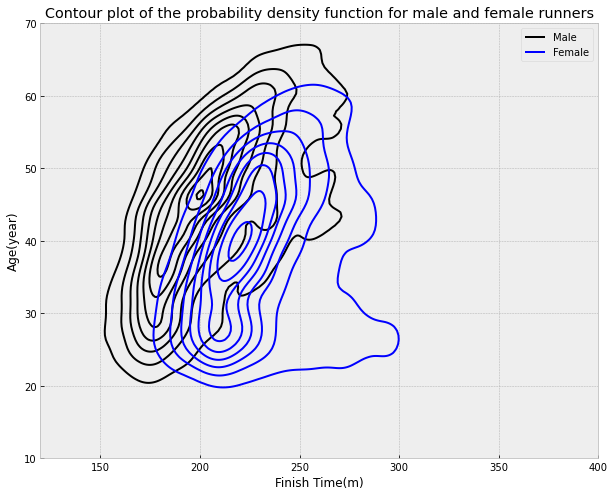

In [68]:
# Plotting the contour plot for male and female funners 
fig, ax = plt.subplots(figsize=(10,8))
# Contour plot for male runners
contour_male = ax.contour(Time, Age, pdfm_2d, levels=10, colors='k')
# Contour plot for male runners
contour_female = ax.contour(Time, Age, pdff_2d, levels=10, colors='b')
c1,_ = contour_male.legend_elements()
c2,_ = contour_female.legend_elements()
ax.legend([c1[0], c2[0]], ['Male', 'Female'])
plt.xlabel('Finish Time(m)')
plt.ylabel('Age(year)')
plt.title('Contour plot of the probability density function for male and female runners')
plt.show()

From the above contour plot, it is obvious that there is distinction between the distribution function for mae and female runners. So we can use them for predicting the gender of a runner given the age and finish time. Now, we redefine the prob_female function for utilizing the information of age and finish time of a runner.

In [69]:
# Probability calculation  2D
def prob_female_2d(time, age):
    """
    This funcition will calculate the probility that a runner is female given the finish time and age.
    
    Args:
        time :
            A float, the time needed to finish the run for a runner.
        age :
            A float/integer which indicates the age of the runner.
        
    Returns:
        prob : 
        The probability that the runner is female whos age is given and complete the run in the given time.
    """
    probM= dfm_train['M/F'].count()/train_df['M/F'].count()
    probF= dff_train['M/F'].count()/train_df['M/F'].count()
    
    total_P = kdem_2d([time, age])*probM+ kdef_2d([time, age])* probF
#     if gender=='M':
#         prob = kdem(time)*probM/total_P
#     elif gender == 'F':
    prob = kdef_2d([time, age]) * probF/total_P 
    return prob


**Prediction Accuracy**

As before, we canculate the prediction accuracy for predinting that a runner is female given the age and finish time of the runner on test data set by considering that if the probability is greater than or equal to 0.5 then the runner is female.

In [70]:
# Predicting probability 
pdf2d_f = prob_female_2d(test_df['Finish_time(m)'], test_df['Age'])

In [71]:
accuracy_kde2 = round((sum((test_df['M/F']=='F')==(pdf2d_f>=0.5))/ test_df['M/F'].count())*100,2)

print(f" The prediction accuracy for predicting that a runner is female given her age and the finished time: \n \
{accuracy_kde2}%")

# print(f" \n The prediction accuracy for predicting that a runner is male given his age and finished time: \n \
# {round((sum((test_df['M/F']=='M')==(pdf2d_f<0.5))/ test_df['M/F'].count())*100,2)}%")

 The prediction accuracy for predicting that a runner is female given her age and the finished time: 
 76.23%


## 3.3 Comparing Accuracy with the Prediction by  k-NN 
We have computed 1-dimensional and 2-dimensional KDE and using the Bayes' theorem, find the probability of a runner to be female given the finish time for 1-dimensional KDE and finish time as well as the age of the runner for 2-dimensional KDE. Now we do it by using the k-nearest neighbors classifier for the both cases and then compare the results. Here the k-NN from sklearn will be implemented.

In [72]:
# Importing the classifier library
from sklearn.neighbors import KNeighborsClassifier

**Case-I: Prediction based on finish time**

In [73]:
# Number of neighbors
k=50
#Training the classifier
knn1 = KNeighborsClassifier(n_neighbors = k)
knn1.fit(train_df[['Finish_time(m)']], train_df['M/F'])

#Prediction on test set
knn1_pred = knn1.predict(test_df[['Finish_time(m)']])

In [74]:
accuracy_knn1 = round((knn1_pred==test_df['M/F']).sum()/ len(test_df)*100,2)
print(f" The prediction accuracy  by k-NN for predicting that a runner is male/female based on the finished time: \n \
{accuracy_knn1}%")


 The prediction accuracy  by k-NN for predicting that a runner is male/female based on the finished time: 
 64.97%


The k-NN also shows a good accuracy for predicting that a runner is male/female when the only the finish time is given and the prediction accuracy is $64.97\%$ which is almost close to the prediction accuracy $65.79\%$ obtained by using 1-dimensional KDE and Bayes theorem.


**Case-II: Prediction based on finish time and age**

Now, we implement the k-NN for given one more information about the runner, their age besides the finish time. 

In [75]:
# Number of neighbors
k=50
# Training the k-NN
knn2 = KNeighborsClassifier(n_neighbors = k)
knn2.fit(train_df[['Finish_time(m)', 'Age']], train_df['M/F'])
# Prediction on test set
knn2_pred = knn2.predict(test_df[['Finish_time(m)', 'Age']])

In [76]:
accuracy_knn2 = round((knn2_pred==test_df['M/F']).sum()/ len(test_df)*100,2)
print(f" The prediction accuracy  by k-NN for predicting that a runner \
is male/female based on the finished time and age: \n {accuracy_knn2}%")

# (knn2_pred==test_df['M/F']).sum()/ len(test_df)

 The prediction accuracy  by k-NN for predicting that a runner is male/female based on the finished time and age: 
 76.27%


In this case the accuracy is same as the prediction found by using the 2-dimensional KDE and Bayes theorem. The summary is given as follows.

In [77]:
print('The prediction accuracy (percentage) of a runner is to be female given finish time and finishtime & age\n')
print('{:>8}  {:>12} {:>16}'.format('                 ', 'Finish Time', '    Finish Time & Age'))
print('                   --------------   --------------------')

print('{:6}  {:>12f} {:>18f}'.format('KDE & Bayes Rule', accuracy_kde1, accuracy_kde2))
print('{:6}  {:>14f} {:>18f}'.format('      k-NN    ', accuracy_knn1, accuracy_knn2))

The prediction accuracy (percentage) of a runner is to be female given finish time and finishtime & age

                    Finish Time     Finish Time & Age
                   --------------   --------------------
KDE & Bayes Rule     65.790000          76.230000
      k-NN           64.970000          76.270000


# 4 Linear Regression 
Linear regression is a model which defines a linear relation between two varibles. A linear regression has the form $Y=a+bX$ where $X$ is the explanatory variable or independent variable,  $Y$ is the dependent variable also known as response and $a$ & $b$ are the parameter of the model known as intercept & coefficient respectively which are estimated from the given data so that the model fit with the data. In this section, we implement linear regression from sklearn on the Marathon data.

First of we use only the time needed to finish first 5K by runners to predict the finish time. And then use others variables like age, sex, etc.

## 4.1 Linear Regression Using 5K Times

In [81]:
# Linear regression model from sklearn 
from sklearn.linear_model import LinearRegression
reg5k = LinearRegression()

In the train as well as test data the time for completing first 5K is a object, so we need to convert it into time object. 

In [78]:
train_df["5K_time(m)"] = pd.to_timedelta(train_df["5K"]).dt.total_seconds()/60
test_df["5K_time(m)"] = pd.to_timedelta(test_df["5K"]).dt.total_seconds()/60


<ipython-input-78-0e0a8a223efe>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



**Fitting the model**

In [82]:
reg5k.fit(train_df[['5K_time(m)']], train_df['Finish_time(m)'])
intercept5k = reg5k.intercept_
coeff5k = reg5k.coef_
print(f" Intercept: {intercept5k} \n Coefficient (slope): {coeff5k}")

 Intercept: -8.802633363830807 
 Coefficient (slope): [9.20147607]


Therefore, the linear model is $$ y = -8.802633363830807 +  9.20147607 x$$

Now, let plot the line and the data points to see how they are related visually.

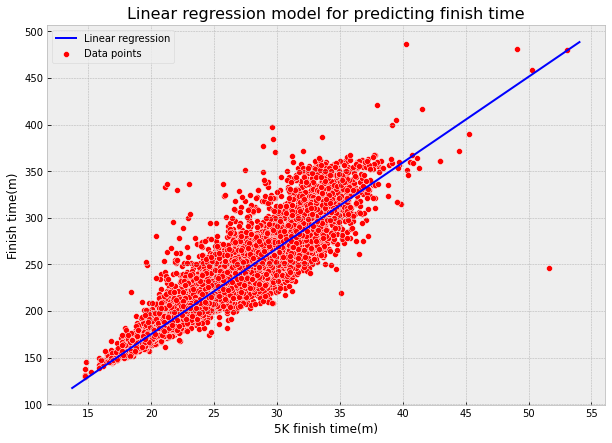

In [83]:
import seaborn as sns 

plt.figure(figsize =(10,7))
sns.scatterplot(data= train_df, x = '5K_time(m)', y = 'Finish_time(m)', 
                color='r', marker ='o', label='Data points')
x = np.linspace(train_df['5K_time(m)'].min()-1, train_df['5K_time(m)'].max()+1)
plt.plot(x, reg5k.coef_[0]*x+reg5k.intercept_, c = 'b', label='Linear regression');
plt.xlabel('5K finish time(m)')
plt.ylabel('Finish time(m)')
plt.title('Linear regression model for predicting finish time', fontsize = 16)
plt.legend()
plt.show()

**Predicting the finish time**

Now, we make the prediction of finish time by using the 5K finish time on the test data so that we can also evaluate the model prediction accuracy. 

In [92]:
# Making prediction
pred_finish_time1  = reg5k.predict(test_df[['5K_time(m)']])
actual_finish_time = np.array(test_df['Finish_time(m)'])

Now, we see how the model predicted on test data. For this let's calculate the error.

In [93]:
abs(pd.DataFrame(data=pred_finish_time1-actual_finish_time, columns = ['Error'])).describe()

,Error
count,6575.000000
mean,10.951919
std,11.165755
min,0.002300
25%,3.803020
50%,7.893764
75%,13.837079
max,147.613690


The mean of absolute values of the error is 10.95 which is not too small but also not too large. So it would be acceptable error and model can reasonably predict the output. We also can measure different type of error like Mean Squared Error $\frac{1}{N} \sum_i(y_i-\hat{y}_i)^2$, and Root Mean Squared Error $\sqrt{\frac{1}{N} \sum_i(y_i-\hat{y}_i)^2}$ where $y_i$ is the true value, $\hat{y}_i$ is the predicted value and $N$ is the number of samples.

In [94]:
from sklearn import metrics
# calculate MSE, RMSE
print(f"The Mean Squared Error: \n {round(metrics.mean_squared_error(actual_finish_time, pred_finish_time1),2)} \n")
print(f"The Root Mean Squared Error: \n {round(np.sqrt(metrics.mean_squared_error(actual_finish_time, pred_finish_time1)),2)}")

The Mean Squared Error: 
 244.6 

The Root Mean Squared Error: 
 15.64


**Evaluation of the Model Fitting**

A good measure to evaluate how a model fit with the data is $R-$squared value. Mathematically it is defined by 
$$R^2 = 1 - \frac{\sum_i(y_i-\hat{y}_i)^2}{\sum_i(y_i-\bar{y})^2}$$
where $\bar{y}= \frac{\sum_i y_i}{N}$. $R-$squared value varies between 0 and 1. The larger the value of $R-$squared the better fit the model, though there is no threshold value of $R-$ squared.

In [95]:
print(f"The R-squared score for the model: \n {reg5k.score(train_df[['5K_time(m)']], train_df['Finish_time(m)'])}")

The R-squared score for the model: 
 0.8418956843674317


From the above results and measures we observe that the linear regression just using the finish time for 5K is reasonable to predict the finish time of the runners. But we would like to make it better if possible. So, we use multiple variables to increase accuracy that means the to decrease the error. 

## 4.2 Linear Regression with Multiple Variables 
In this subsection the variables like age, sex of the runners will be considered for building the regression model and we calculate the errors and the R-squared score to check that it is really good to make better model or just will increase the complexity of the model.

In [96]:
# Building model and fitting to data 
reg_multiple = LinearRegression()
reg_multiple.fit(train_df[['5K_time(m)', 'Age']], train_df['Finish_time(m)'])

LinearRegression()

**Evaluation on the prediction and error calculation**

In [97]:
# Making prediction
pred_finish_time2  = reg_multiple.predict(test_df[['5K_time(m)', 'Age']])
abs(pd.DataFrame(data=pred_finish_time2-actual_finish_time, columns = ['Error'])).describe()

,Error
count,6575.000000
mean,10.902104
std,11.043716
min,0.001655
25%,3.875374
50%,7.852700
75%,13.897944
max,151.339000


In [98]:
# Calculate MSE, RMSE
print(f"The Mean Squared Error: \n {round(metrics.mean_squared_error(actual_finish_time, pred_finish_time2),2)} \n")
print(f"The Root Mean Squared Error: \n {round(np.sqrt(metrics.mean_squared_error(actual_finish_time, pred_finish_time2)),2)}")

The Mean Squared Error: 
 240.8 

The Root Mean Squared Error: 
 15.52


**Evaluation of the model fitting on R-squared score**

In [99]:
print(f"The R-squared score for the model: \n{reg_multiple.score(train_df[['5K_time(m)', 'Age']], train_df['Finish_time(m)'])}")

The R-squared score for the model: 
0.844258294979552


Therefore, adding another variable 'Age' does improve the model slightly. So, one can consider either model to predict the finish time because both are almost similar in terms of predicting result. But the later one is slightly complex though it makes a bit Improvement. There are also other variables, one can consider them either they make improvement or not.We will further try with another variables gender.

**Ading gender as another variable**

To add gender of the runners we need to convert them into quantitative from characteristic variables. We we create a dummy dataframe with gender information and then concatenate it with the main data. 

In [100]:
train_df_mf = pd.concat([train_df, pd.get_dummies(train_df['M/F'])], axis=1)
test_df_mf = pd.concat([test_df, pd.get_dummies(test_df['M/F'])], axis=1)

In [101]:
# Building and fitting the model 
reg_multiple2 = LinearRegression()
reg_multiple2.fit(train_df_mf[['5K_time(m)', 'Age', 'F', 'M']], train_df_mf['Finish_time(m)'])

LinearRegression()

**Evaluating model**

In [102]:
# R-squared score
print(f"The R-squared score for the model: \n{reg_multiple2.score(train_df_mf[['5K_time(m)', 'Age', 'F', 'M']], train_df_mf['Finish_time(m)'])}")

The R-squared score for the model: 
0.8442615441161077


In [103]:
# Prediction 
pred_time3 = reg_multiple2.predict(test_df_mf[['5K_time(m)', 'Age', 'F','M']])

#Errors calculation 
#calculate MSE, RMSE
print(f"The Mean Squared Error: \n {round(metrics.mean_squared_error(actual_finish_time, pred_time3),2)} \n")
print(f"The Root Mean Squared Error: \n {round(np.sqrt(metrics.mean_squared_error(actual_finish_time, pred_time3)),2)}")

The Mean Squared Error: 
 240.73 

The Root Mean Squared Error: 
 15.52


Adding the gender of the runners as a predictor does nor improve the R-squared score as well as does not decrease the errors. However, it makes the model more complex. So, it would be better not to consider the sex of the runners to predict the finish time in this case at least. 

# 5 Conclusion
In this project, we computed 1-dimensional and 2-dimensional kernel density estimation (KDE) on marathon results data. The best estimator bandwidth value has been determined by using log-likelihood on validation data and the best value has been used in the KDE computation. Also along with the KDE the Bayes' theorem has been applied to predict that a runner is either male or femnale with given finish time for 1-dimensional KDE and given finish time and age in the case of 2-dimensional KDE. The results are pretty good in the prediction on the test dataset. Also the predictions have been compared with the prediction by k-NN method. In both cases the prediction are almost same. Moreover, we build simple and multiple linear regression to predict the finish time by using the time to finish 5K run for the case of simple linear regression and time for 5K run, age, and the sex are used in mutiple case. The model developed by using 5K run time and age is better than others. 